# Comparison of different MPI calibrations

In [1]:
import pandas
import os
import altair as alt
import matplotlib.pyplot as plt
import zipfile
import io
import yaml
import numpy
import palettable

# Utility functions

These are used to build the dataframes from the archive content.

In [2]:
def extract_zip(zip_name):
    '''Taken from https://stackoverflow.com/a/10909016/4110059'''
    input_zip = zipfile.ZipFile(zip_name)
    result = {}
    deployment = yaml.load(input_zip.read('info.yaml'))['deployment']
    experiment = zip_name[zip_name.index('/')+1:]
    experiment = experiment[:experiment.index('_')]
    for name in input_zip.namelist():
        if name.endswith('.csv'):
            dataframe = pandas.read_csv(io.BytesIO(input_zip.read(name)), names = ['op', 'msg_size', 'start', 'duration'])
            dataframe['experiment'] = experiment
            dataframe['type'] = name
            dataframe['deployment'] = deployment
            dataframe['index'] = range(len(dataframe))
            result[name] = dataframe
    return result


def extract_folder(folder_name):
    result = {}
    for root, dirs, files in os.walk(folder_name):
        for file in files:
            if file.endswith('.zip'):
                filename = os.path.join(root, file)
                result[filename] = extract_zip(filename)
    return result


def aggregate_dataframe(dataframe):
    df = dataframe.groupby('msg_size').mean().reset_index()
    df['experiment'] = dataframe['experiment'].unique()[0]
    return df


def lower_quantile(df):
    df = pandas.DataFrame(df)
    quantiles = df.groupby('msg_size').quantile(0.5).reset_index()
    df['above_quantile'] = True
    for size in quantiles.msg_size:
        duration_thresh = quantiles[quantiles.msg_size == size].duration.unique()[0]
        df.loc[(df.msg_size == size) & (df.duration < duration_thresh), 'above_quantile'] = False
    return df[~df.above_quantile]


def merge_dataframes(folder_dict, dataframe_name, dataframe_processing=lambda x: x):
    all_df = []
    for folder, dataframes in folder_dict.items():
        all_df.append(dataframe_processing(dataframes[dataframe_name]))
    return pandas.concat(all_df)

def get_file(zip_name, file_name):
    return zipfile.ZipFile(zip_name).read(file_name).decode('ascii')

In [3]:
dataframes = extract_folder('results_paravance_deploy2/')
alldf = merge_dataframes(dataframes, 'exp/exp_Recv.csv')
print('\n'.join(list(alldf.experiment.unique())))
alldf.deployment =  pandas.Categorical(alldf.deployment, categories=[False] + ['debian9-x64-%s' % mode for mode in ['min', 'base', 'nfs', 'big']], ordered=True)
print(len(alldf))
alldf.head(3)

paravance-10-paravance-5
paravance-1-paravance-8
paravance-13-paravance-2
paravance-3-paravance-4
662000


,op,msg_size,start,duration,experiment,type,deployment,index
0,MPI_Recv,765921,0.006518,0.000779,paravance-10-paravance-5,exp/exp_Recv.csv,debian9-x64-big,0
1,MPI_Recv,765921,0.010237,0.000786,paravance-10-paravance-5,exp/exp_Recv.csv,debian9-x64-big,1
2,MPI_Recv,765921,0.014268,0.000854,paravance-10-paravance-5,exp/exp_Recv.csv,debian9-x64-big,2


## Global visualization of all the experiments

In [4]:
import altair as alt

def do_plot(df, x, y, color, facet, log_y=True, title=None):
    highlight = alt.selection(type='single', on='mouseover',
                              fields=[color], nearest=True)
    ydomain = [min(df[y]), max(df[y])]
    scale = alt.Scale(type='log', domain=ydomain) if log_y else alt.Scale(domain=ydomain)
    base = alt.Chart(df.sample(n=5000)).encode(
        x=alt.X(x, scale=alt.Scale(type='log')),
        y=alt.Y(y, scale=scale),
        color=color
    )
    points = base.mark_circle().encode(
        opacity=alt.value(0)
    ).add_selection(
        highlight
    ).properties(
        width=1000, height=600
    )
    lines = base.mark_point().encode(
        size=alt.condition(~highlight, alt.value(1), alt.value(30))
    )
    plot = points + lines
    if title:
        plot = plot.properties(title=title)
    return plot

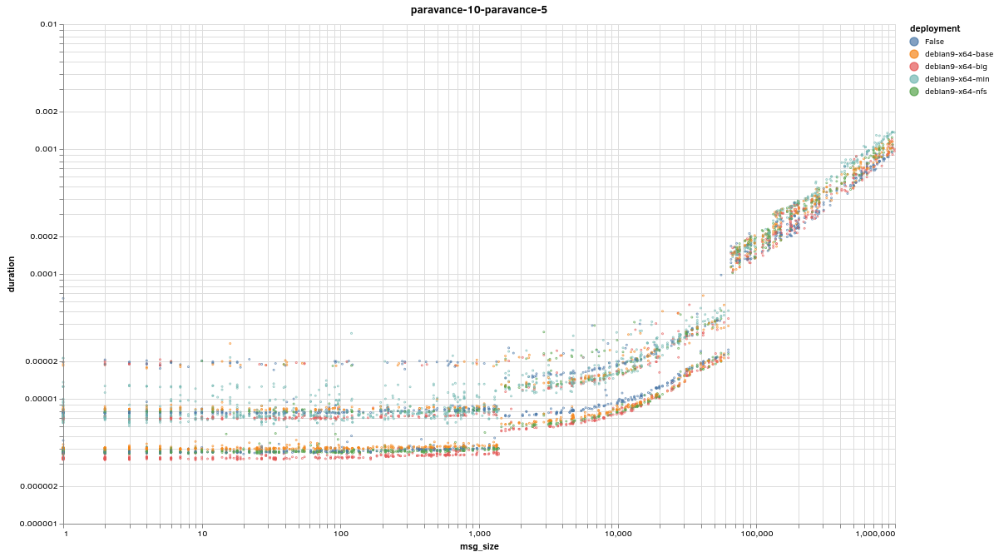

In [5]:
exp = alldf.experiment.unique()[0]
do_plot(alldf[alldf.experiment == exp], x='msg_size', y='duration', color='deployment', facet='experiment', title=exp)

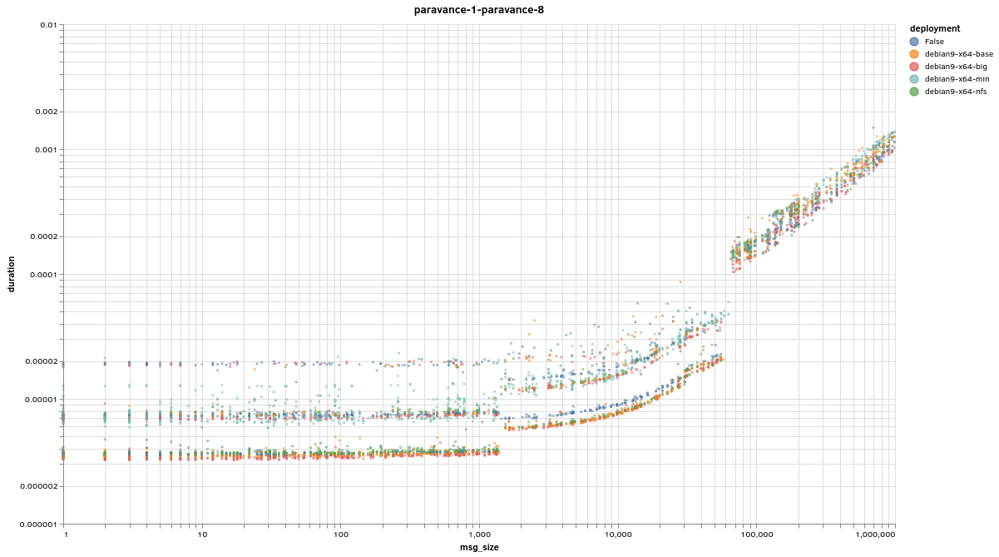

In [6]:
exp = alldf.experiment.unique()[1]
do_plot(alldf[alldf.experiment == exp], x='msg_size', y='duration', color='deployment', facet='experiment', title=exp)

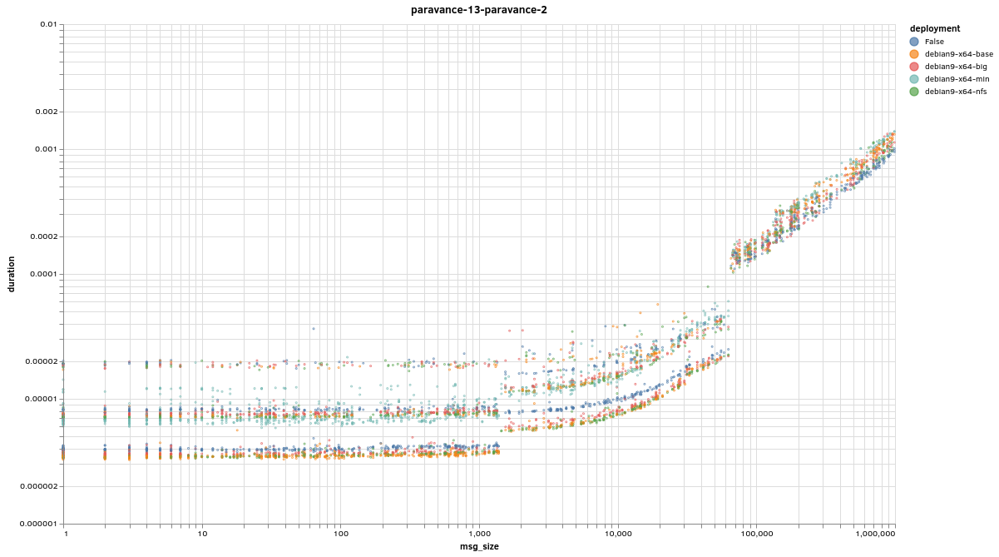

In [7]:
exp = alldf.experiment.unique()[2]
do_plot(alldf[alldf.experiment == exp], x='msg_size', y='duration', color='deployment', facet='experiment', title=exp)

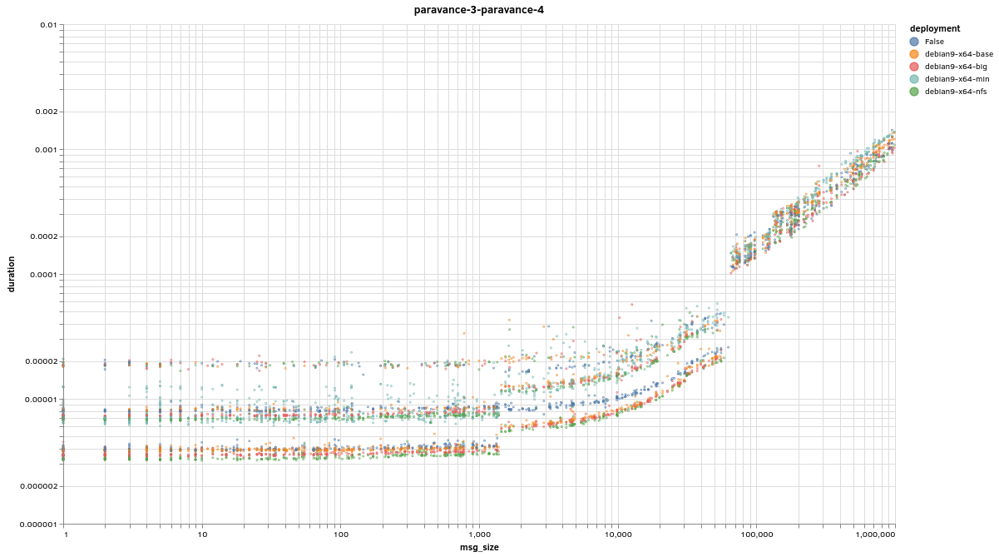

In [8]:
exp = alldf.experiment.unique()[3]
do_plot(alldf[alldf.experiment == exp], x='msg_size', y='duration', color='deployment', facet='experiment', title=exp)

## Histograms for different message sizes

In [9]:
def plot_histo(df, experiment, msg_size, bin_step):
    df = pandas.DataFrame(df)
    df = df[(df.experiment == experiment) & (df.msg_size == msg_size)]
    domain = [min(df.duration)-bin_step, max(df.duration)+bin_step]
    bins = numpy.arange(domain[0], domain[1] + bin_step, bin_step)
    def f(deployment, color=None):
        tmp = df[df.deployment == deployment]
        tmp[['duration', 'deployment']].hist(range=domain, figsize=(12,6), bins=bins, color=color)
        plt.title('Deployment: %s' % deployment)
    deployments = [False] + ['debian9-x64-%s' % mode for mode in ['min', 'base', 'nfs', 'big']]
    colors = palettable.colorbrewer.qualitative.Dark2_5.mpl_colors
    for i, dep in enumerate(deployments):
        f(dep, colors[i])
    plt.show()

### Very small message

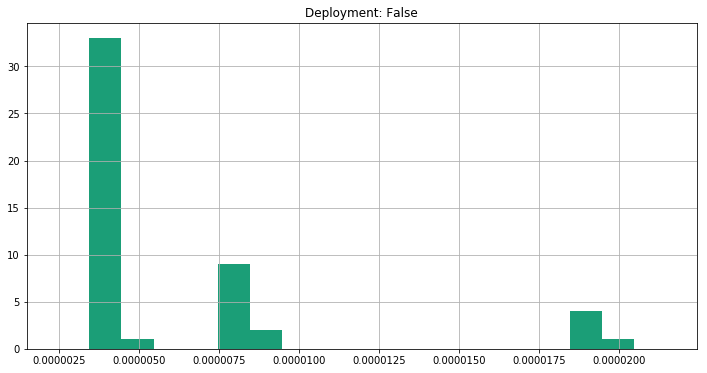

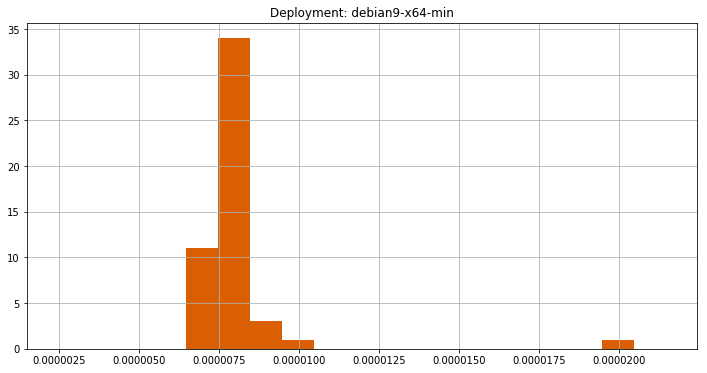

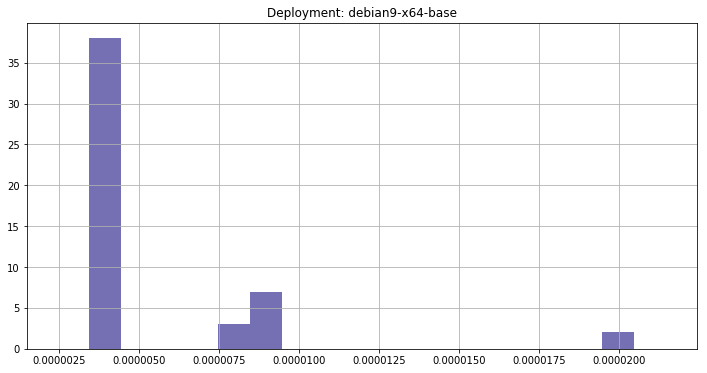

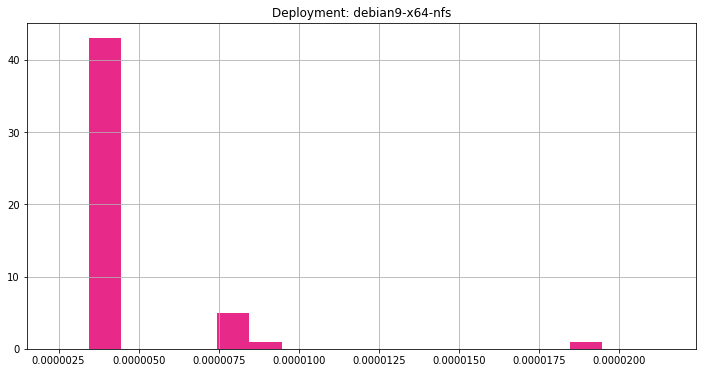

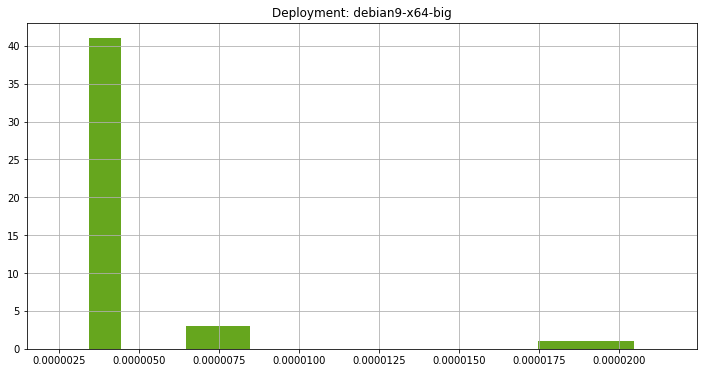

In [10]:
plot_histo(alldf, 'paravance-10-paravance-5', 563, 1e-6)

### Small message

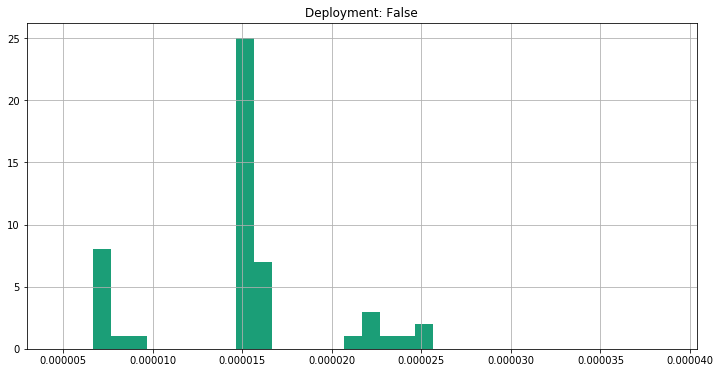

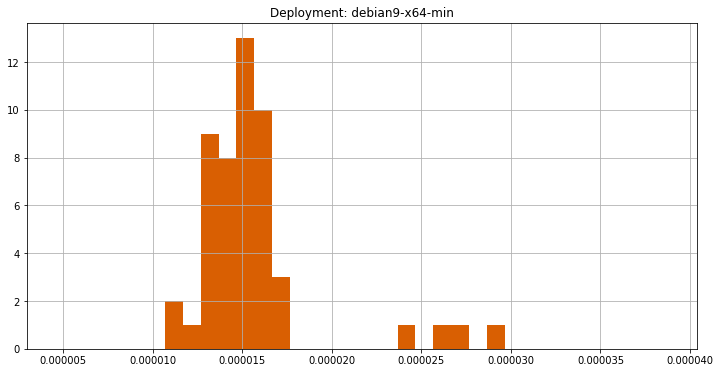

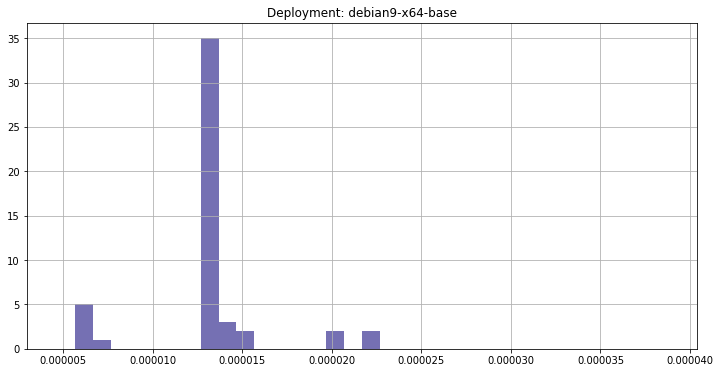

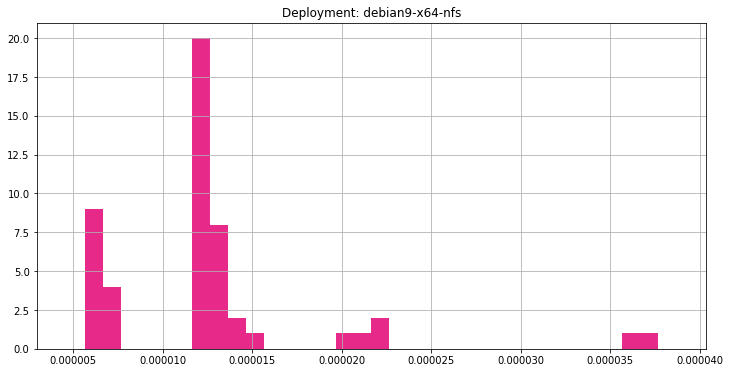

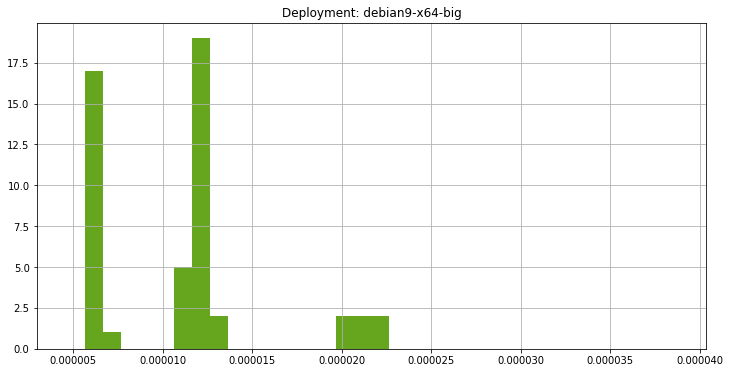

In [11]:
plot_histo(alldf, 'paravance-10-paravance-5', 1636, 1e-6)

### Medium message

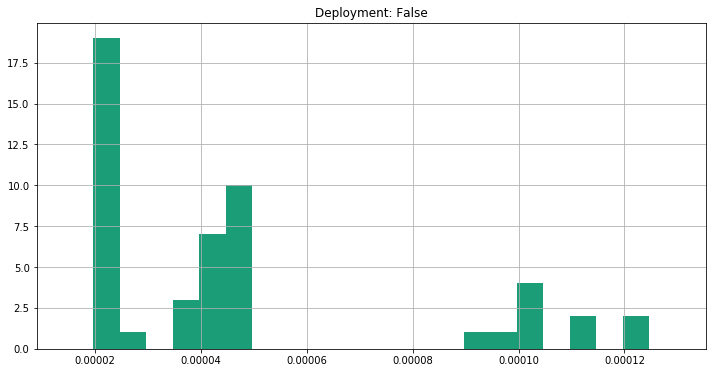

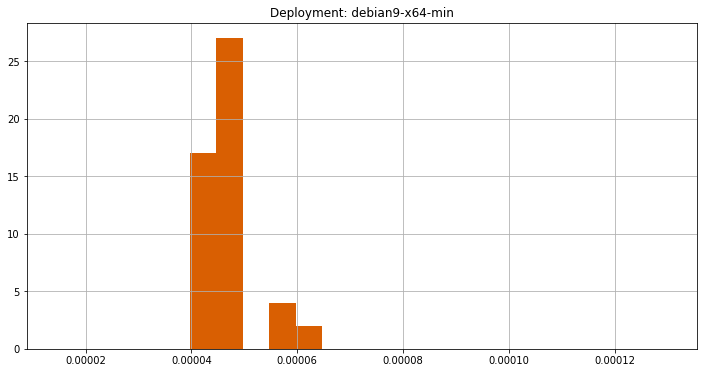

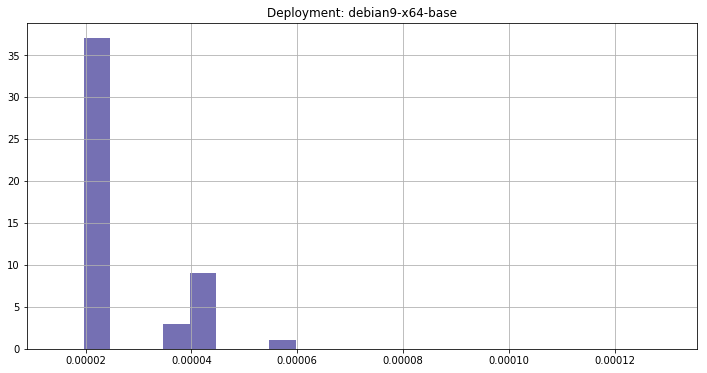

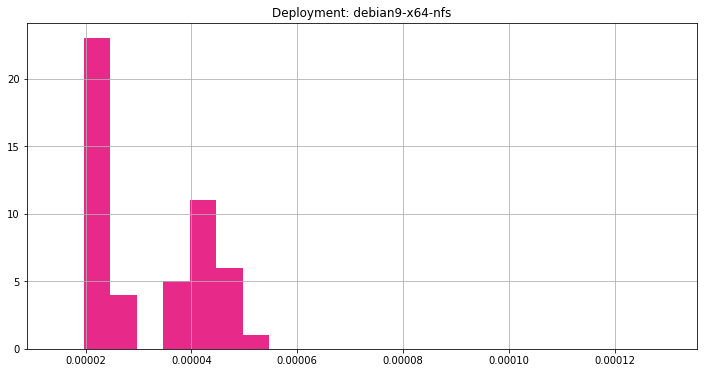

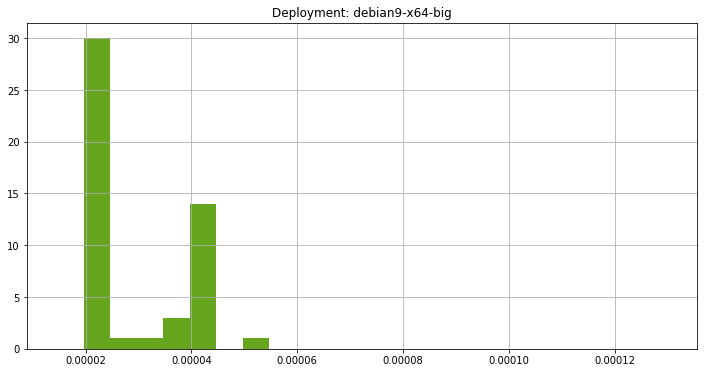

In [12]:
plot_histo(alldf, 'paravance-10-paravance-5', 55659, 5e-6)

### Large message

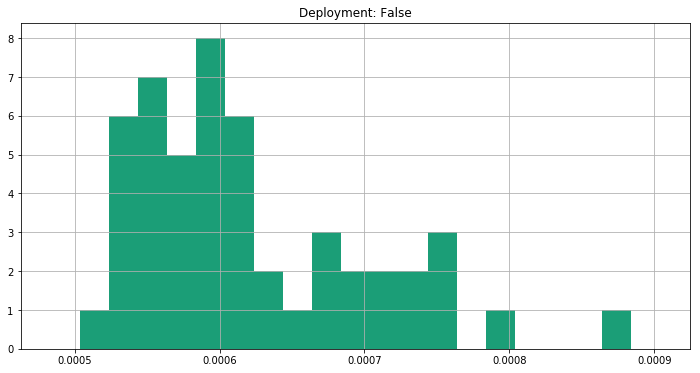

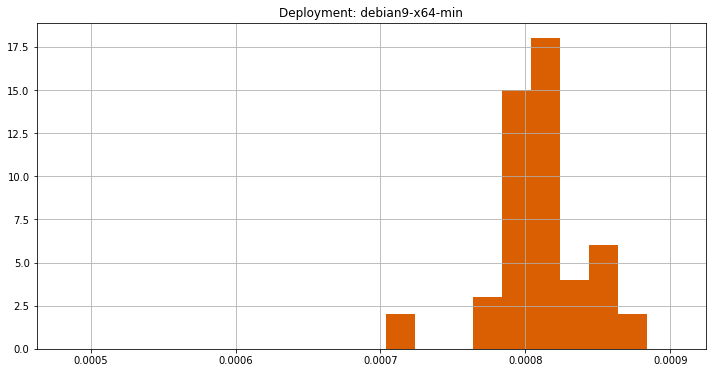

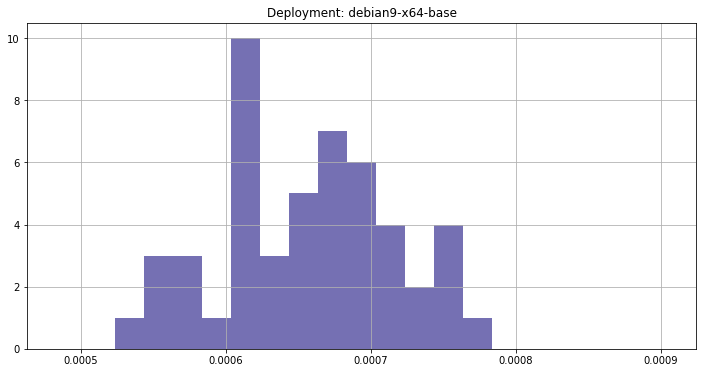

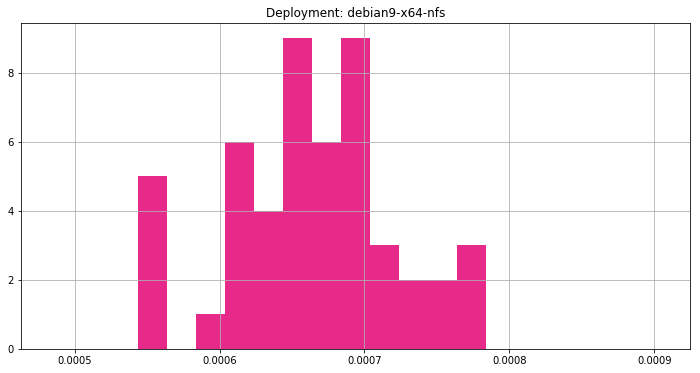

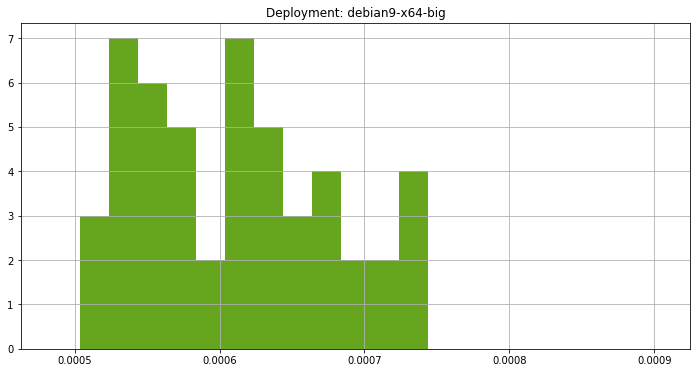

In [13]:
plot_histo(alldf, 'paravance-10-paravance-5', 521808, 2e-5)